In [6]:
%matplotlib inline
from new_methods.new_methods import My_NuScenes

nusc = My_NuScenes(version='v1.0-mini', dataroot='/data/datasets/nuscenes', verbose=True)

Loading NuScenes tables for version v1.0-mini...
23 category,
8 attribute,
4 visibility,
911 instance,
12 sensor,
120 calibrated_sensor,
31206 ego_pose,
8 log,
10 scene,
404 sample,
31206 sample_data,
18538 sample_annotation,
4 map,
Done loading in 0.250 seconds.
Reverse indexing ...
Done reverse indexing in 0.0 seconds.


In [2]:
my_scene = nusc.scene[0]
my_scene

{'token': 'cc8c0bf57f984915a77078b10eb33198',
 'log_token': '7e25a2c8ea1f41c5b0da1e69ecfa71a2',
 'nbr_samples': 39,
 'first_sample_token': 'ca9a282c9e77460f8360f564131a8af5',
 'last_sample_token': 'ed5fc18c31904f96a8f0dbb99ff069c0',
 'name': 'scene-0061',
 'description': 'Parked truck, construction, intersection, turn left, following a van'}

In [3]:
nusc.get('scene', my_scene['token'])

{'token': 'cc8c0bf57f984915a77078b10eb33198',
 'log_token': '7e25a2c8ea1f41c5b0da1e69ecfa71a2',
 'nbr_samples': 39,
 'first_sample_token': 'ca9a282c9e77460f8360f564131a8af5',
 'last_sample_token': 'ed5fc18c31904f96a8f0dbb99ff069c0',
 'name': 'scene-0061',
 'description': 'Parked truck, construction, intersection, turn left, following a van'}

In [4]:
nusc.list_scenes()

scene-0061, Parked truck, construction, intersectio... [18-07-24 03:28:47]   19s, singapore-onenorth, #anns:4622
scene-0103, Many peds right, wait for turning car, ... [18-08-01 19:26:43]   19s, boston-seaport, #anns:2046
scene-0655, Parking lot, parked cars, jaywalker, be... [18-08-27 15:51:32]   20s, boston-seaport, #anns:2332
scene-0553, Wait at intersection, bicycle, large tr... [18-08-28 20:48:16]   20s, boston-seaport, #anns:1950
scene-0757, Arrive at busy intersection, bus, wait ... [18-08-30 19:25:08]   20s, boston-seaport, #anns:592
scene-0796, Scooter, peds on sidewalk, bus, cars, t... [18-10-02 02:52:24]   20s, singapore-queensto, #anns:708
scene-0916, Parking lot, bicycle rack, parked bicyc... [18-10-08 07:37:13]   20s, singapore-queensto, #anns:2387
scene-1077, Night, big street, bus stop, high speed... [18-11-21 11:39:27]   20s, singapore-hollandv, #anns:890
scene-1094, Night, after rain, many peds, PMD, ped ... [18-11-21 11:47:27]   19s, singapore-hollandv, #anns:1762
sc

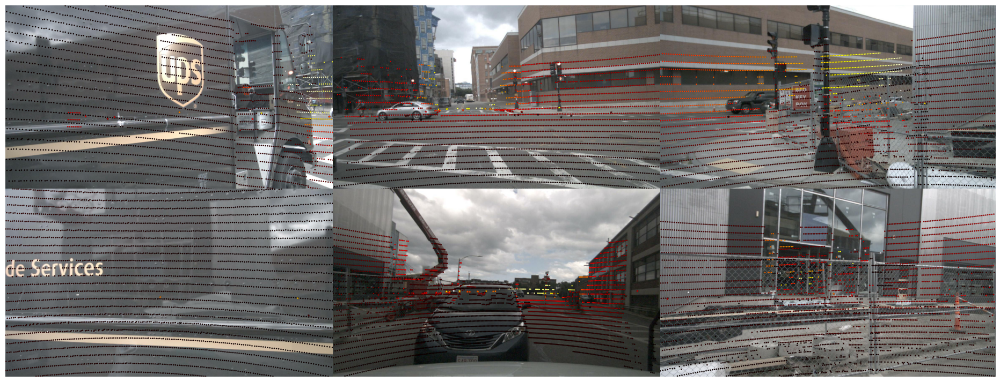

In [5]:
nusc.render_pointcloud_in_scene(nusc.sample[196]['token'], show_both_modality=True, verbose=True)

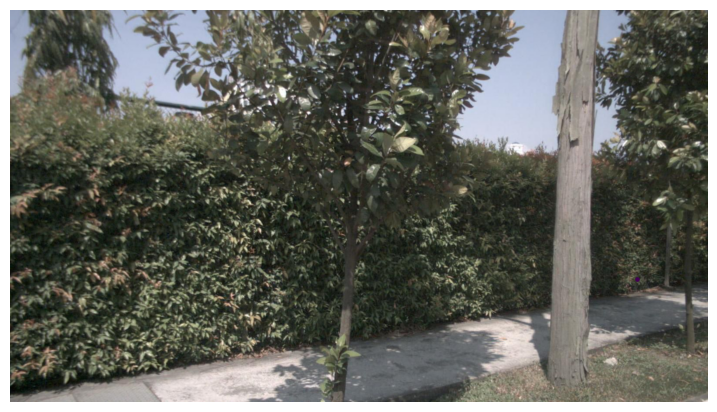

In [6]:
nusc.render_pointcloud_in_image(nusc.sample[236]['token'], pointsensor_channel='RADAR_FRONT', camera_channel='CAM_FRONT_LEFT')

In [7]:
nusc.render_sample_new(nusc.sample[236]['token'], nsweeps=5,
                       out_path='/home/byounghun/workspace/sample_bev.jpg',
                       sample_path='/home/byounghun/workspace/sample.jpg')

no radar point cloud in this (sample token, sample timestamp, image):  ( 26e594c412e84bdda76e344933fe305a 1538448761548500 , CAM_FRONT_LEFT )
--------------------------------------------------------------------
no radar point cloud in this (sample token, sample timestamp, image):  ( 26e594c412e84bdda76e344933fe305a 1538448761548500 , CAM_BACK_LEFT )
--------------------------------------------------------------------
no radar point cloud in this (sample token, sample timestamp, image):  ( 26e594c412e84bdda76e344933fe305a 1538448761548500 , CAM_BACK_RIGHT )
--------------------------------------------------------------------


In [ ]:
from tqdm import tqdm
import os.path as osp
import matplotlib.pyplot as plt
base_path_1 = '/home/byounghun/workspace/Nuscenes_tutorial/visualization/Radar_LiDAR_pointcloud/images+bev'
base_path_2 = '/home/byounghun/workspace/Nuscenes_tutorial/visualization/Radar_LiDAR_pointcloud/bev'
nsweeps = 1
sweep_path = 'nsweeps_' + str(nsweeps)
for sample in tqdm(nusc.sample):
    file_name = str(sample['timestamp']) + '.jpg'
    sample_path = osp.join(base_path_1, sweep_path, file_name)
    out_path = osp.join(base_path_2, sweep_path, file_name)
    if osp.exists(sample_path):
        continue
    nusc.render_sample_new(sample['token'], nsweeps=nsweeps, out_path=out_path, sample_path=sample_path)
    plt.close('all')

 19%|██████████▏                                          | 78/404 [08:08<31:53,  5.87s/it]

no radar point cloud in this (sample token, sample timestamp, image):  ( 281b92269fd648d4b52d06ac06ca6d65 1533151622948227 , CAM_BACK_RIGHT )
--------------------------------------------------------------------


 32%|████████████████▊                                   | 131/404 [13:39<31:42,  6.97s/it]

In [8]:
from tqdm import tqdm
import os.path as osp
base_path = '/home/byounghun/workspace/Nuscenes_tutorial/visualization/Radar_LiDAR_pointcloud/images'
for sample in tqdm(nusc.sample):
    file_name = str(sample['timestamp']) + '.jpg'
    out_path = osp.join(base_path, file_name)
    if osp.exists(out_path):
        continue
    nusc.render_pointcloud_in_scene(sample['token'], out_path = out_path, show_both_modality=True, verbose=False)

 19%|██████████▏                                          | 78/404 [03:35<13:10,  2.43s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1533151622948227 , CAM_BACK_RIGHT )
------------------------------------------------


 34%|█████████████████▋                                  | 137/404 [06:22<12:29,  2.81s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1535385100398781 , CAM_BACK_RIGHT )
------------------------------------------------


 35%|██████████████████▏                                 | 141/404 [06:33<12:19,  2.81s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1535385102447561 , CAM_BACK_RIGHT )
------------------------------------------------


 38%|███████████████████▋                                | 153/404 [07:10<14:05,  3.37s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1535385108451734 , CAM_BACK_RIGHT )
------------------------------------------------


 46%|███████████████████████▊                            | 185/404 [08:57<12:54,  3.54s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1535657120149686 , CAM_BACK_LEFT )
------------------------------------------------


 46%|███████████████████████▉                            | 186/404 [09:01<13:20,  3.67s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1535657120649535 , CAM_BACK_LEFT )
------------------------------------------------


 50%|██████████████████████████                          | 202/404 [09:51<11:01,  3.28s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538448744447639 , CAM_BACK_LEFT )
------------------------------------------------


 51%|██████████████████████████▍                         | 205/404 [10:02<12:13,  3.69s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538448746047898 , CAM_FRONT_LEFT )
------------------------------------------------
no radar point cloud in this (timestamp of sample, image):  ( 1538448746047898 , CAM_BACK_LEFT )
------------------------------------------------


 51%|██████████████████████████▌                         | 206/404 [10:06<12:12,  3.70s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538448746548329 , CAM_BACK_LEFT )
------------------------------------------------


 51%|██████████████████████████▋                         | 207/404 [10:09<11:34,  3.53s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538448747047643 , CAM_BACK_LEFT )
------------------------------------------------


 51%|██████████████████████████▊                         | 208/404 [10:11<10:11,  3.12s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538448747547529 , CAM_FRONT_LEFT )
------------------------------------------------
no radar point cloud in this (timestamp of sample, image):  ( 1538448747547529 , CAM_BACK_LEFT )
------------------------------------------------


 52%|███████████████████████████                         | 210/404 [10:18<10:18,  3.19s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538448748547277 , CAM_BACK_LEFT )
------------------------------------------------


 55%|████████████████████████████▌                       | 222/404 [11:05<11:28,  3.78s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538448754547448 , CAM_BACK_LEFT )
------------------------------------------------


 56%|████████████████████████████▉                       | 225/404 [11:15<10:36,  3.56s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538448756050426 , CAM_FRONT_LEFT )
------------------------------------------------
no radar point cloud in this (timestamp of sample, image):  ( 1538448756050426 , CAM_BACK_LEFT )
------------------------------------------------


 56%|█████████████████████████████                       | 226/404 [11:18<09:58,  3.36s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538448756547528 , CAM_BACK_LEFT )
------------------------------------------------


 56%|█████████████████████████████▎                      | 228/404 [11:26<10:22,  3.54s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538448757548354 , CAM_BACK_LEFT )
------------------------------------------------


 57%|█████████████████████████████▍                      | 229/404 [11:29<10:39,  3.65s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538448758048230 , CAM_BACK_LEFT )
------------------------------------------------


 57%|█████████████████████████████▌                      | 230/404 [11:32<09:40,  3.33s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538448758547578 , CAM_BACK_LEFT )
------------------------------------------------


 57%|█████████████████████████████▋                      | 231/404 [11:37<10:45,  3.73s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538448759047433 , CAM_BACK_LEFT )
------------------------------------------------


 57%|█████████████████████████████▊                      | 232/404 [11:40<10:44,  3.74s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538448759546758 , CAM_BACK_LEFT )
------------------------------------------------


 58%|█████████████████████████████▉                      | 233/404 [11:43<09:35,  3.37s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538448760047738 , CAM_FRONT_LEFT )
------------------------------------------------
no radar point cloud in this (timestamp of sample, image):  ( 1538448760047738 , CAM_BACK_LEFT )
------------------------------------------------


 58%|██████████████████████████████                      | 234/404 [11:47<09:58,  3.52s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538448760548179 , CAM_FRONT_LEFT )
------------------------------------------------
no radar point cloud in this (timestamp of sample, image):  ( 1538448760548179 , CAM_BACK_LEFT )
------------------------------------------------


 58%|██████████████████████████████▏                     | 235/404 [11:50<10:00,  3.55s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538448761048087 , CAM_FRONT_LEFT )
------------------------------------------------
no radar point cloud in this (timestamp of sample, image):  ( 1538448761048087 , CAM_BACK_LEFT )
------------------------------------------------


 58%|██████████████████████████████▍                     | 236/404 [11:55<10:45,  3.84s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538448761548500 , CAM_FRONT_LEFT )
------------------------------------------------
no radar point cloud in this (timestamp of sample, image):  ( 1538448761548500 , CAM_BACK_LEFT )
------------------------------------------------
no radar point cloud in this (timestamp of sample, image):  ( 1538448761548500 , CAM_BACK_RIGHT )
------------------------------------------------


 59%|██████████████████████████████▌                     | 237/404 [11:58<09:43,  3.49s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538448762048350 , CAM_FRONT_LEFT )
------------------------------------------------
no radar point cloud in this (timestamp of sample, image):  ( 1538448762048350 , CAM_BACK_LEFT )
------------------------------------------------


 59%|██████████████████████████████▋                     | 238/404 [12:04<12:01,  4.35s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538448762547686 , CAM_FRONT_LEFT )
------------------------------------------------
no radar point cloud in this (timestamp of sample, image):  ( 1538448762547686 , CAM_BACK_LEFT )
------------------------------------------------


 59%|██████████████████████████████▊                     | 239/404 [12:08<11:24,  4.15s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538448763047541 , CAM_FRONT_LEFT )
------------------------------------------------
no radar point cloud in this (timestamp of sample, image):  ( 1538448763047541 , CAM_BACK_LEFT )
------------------------------------------------


 59%|██████████████████████████████▉                     | 240/404 [12:13<11:56,  4.37s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538448763547987 , CAM_BACK_LEFT )
------------------------------------------------


 60%|███████████████████████████████                     | 241/404 [12:17<11:35,  4.27s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538448764047314 , CAM_BACK_LEFT )
------------------------------------------------


 64%|█████████████████████████████████▍                  | 260/404 [13:17<07:38,  3.19s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538984242447730 , CAM_BACK_LEFT )
------------------------------------------------


 66%|██████████████████████████████████                  | 265/404 [13:33<07:29,  3.23s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538984244946513 , CAM_BACK_LEFT )
------------------------------------------------


 66%|██████████████████████████████████▎                 | 267/404 [13:40<07:29,  3.28s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538984245947391 , CAM_BACK_LEFT )
------------------------------------------------


 66%|██████████████████████████████████▍                 | 268/404 [13:43<07:33,  3.34s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1538984246447815 , CAM_BACK_LEFT )
------------------------------------------------


 71%|████████████████████████████████████▊               | 286/404 [14:44<07:26,  3.79s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800369448339 , CAM_FRONT_LEFT )
------------------------------------------------


 71%|████████████████████████████████████▉               | 287/404 [14:46<06:14,  3.20s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800369949334 , CAM_FRONT_LEFT )
------------------------------------------------
no radar point cloud in this (timestamp of sample, image):  ( 1542800369949334 , CAM_BACK_LEFT )
------------------------------------------------


 71%|█████████████████████████████████████               | 288/404 [14:49<06:22,  3.30s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800370450291 , CAM_FRONT_LEFT )
------------------------------------------------
no radar point cloud in this (timestamp of sample, image):  ( 1542800370450291 , CAM_BACK_LEFT )
------------------------------------------------


 72%|█████████████████████████████████████▏              | 289/404 [14:52<06:06,  3.18s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800370949037 , CAM_FRONT_LEFT )
------------------------------------------------
no radar point cloud in this (timestamp of sample, image):  ( 1542800370949037 , CAM_BACK_LEFT )
------------------------------------------------


 72%|█████████████████████████████████████▎              | 290/404 [14:56<06:32,  3.44s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800371448359 , CAM_FRONT_LEFT )
------------------------------------------------
no radar point cloud in this (timestamp of sample, image):  ( 1542800371448359 , CAM_BACK_LEFT )
------------------------------------------------


 72%|█████████████████████████████████████▍              | 291/404 [15:00<06:28,  3.44s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800371948272 , CAM_FRONT_LEFT )
------------------------------------------------
no radar point cloud in this (timestamp of sample, image):  ( 1542800371948272 , CAM_BACK_LEFT )
------------------------------------------------


 72%|█████████████████████████████████████▌              | 292/404 [15:04<07:06,  3.81s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800372397808 , CAM_BACK_LEFT )
------------------------------------------------


 73%|█████████████████████████████████████▉              | 295/404 [15:17<07:47,  4.28s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800373947765 , CAM_FRONT_LEFT )
------------------------------------------------


 73%|██████████████████████████████████████              | 296/404 [15:21<07:09,  3.98s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800374447637 , CAM_FRONT_LEFT )
------------------------------------------------
no radar point cloud in this (timestamp of sample, image):  ( 1542800374447637 , CAM_BACK_LEFT )
------------------------------------------------


 74%|██████████████████████████████████████▏             | 297/404 [15:25<07:13,  4.05s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800374947539 , CAM_FRONT_LEFT )
------------------------------------------------
no radar point cloud in this (timestamp of sample, image):  ( 1542800374947539 , CAM_BACK_LEFT )
------------------------------------------------


 74%|██████████████████████████████████████▎             | 298/404 [15:29<07:23,  4.18s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800375447384 , CAM_BACK_LEFT )
------------------------------------------------


 74%|██████████████████████████████████████▌             | 300/404 [15:35<05:58,  3.45s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800376447154 , CAM_BACK_LEFT )
------------------------------------------------


 75%|███████████████████████████████████████             | 303/404 [15:44<05:04,  3.01s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800377898133 , CAM_FRONT_LEFT )
------------------------------------------------
no radar point cloud in this (timestamp of sample, image):  ( 1542800377898133 , CAM_BACK_LEFT )
------------------------------------------------


 75%|███████████████████████████████████████▏            | 304/404 [15:47<05:15,  3.15s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800378397983 , CAM_FRONT_LEFT )
------------------------------------------------
no radar point cloud in this (timestamp of sample, image):  ( 1542800378397983 , CAM_BACK_LEFT )
------------------------------------------------


 75%|███████████████████████████████████████▎            | 305/404 [15:52<05:58,  3.62s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800378897841 , CAM_BACK_LEFT )
------------------------------------------------


 76%|███████████████████████████████████████▍            | 306/404 [15:56<06:09,  3.77s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800379397716 , CAM_BACK_LEFT )
------------------------------------------------


 76%|███████████████████████████████████████▌            | 307/404 [15:59<05:33,  3.44s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800379897591 , CAM_FRONT_LEFT )
------------------------------------------------
no radar point cloud in this (timestamp of sample, image):  ( 1542800379897591 , CAM_BACK_LEFT )
------------------------------------------------


 76%|███████████████████████████████████████▋            | 308/404 [16:03<05:47,  3.62s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800380398024 , CAM_BACK_LEFT )
------------------------------------------------


 76%|███████████████████████████████████████▊            | 309/404 [16:08<06:18,  3.98s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800380947696 , CAM_FRONT_LEFT )
------------------------------------------------
no radar point cloud in this (timestamp of sample, image):  ( 1542800380947696 , CAM_BACK_LEFT )
------------------------------------------------


 77%|███████████████████████████████████████▉            | 310/404 [16:11<06:05,  3.88s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800381448102 , CAM_BACK_LEFT )
------------------------------------------------


 77%|████████████████████████████████████████▏           | 312/404 [16:24<08:11,  5.34s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800382397543 , CAM_BACK_LEFT )
------------------------------------------------


 77%|████████████████████████████████████████▎           | 313/404 [16:31<08:52,  5.85s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800382897959 , CAM_BACK_LEFT )
------------------------------------------------


 80%|█████████████████████████████████████████▍          | 322/404 [17:13<06:28,  4.74s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800387397971 , CAM_FRONT_LEFT )
------------------------------------------------


 80%|█████████████████████████████████████████▌          | 323/404 [17:19<07:03,  5.23s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800387897823 , CAM_BACK_LEFT )
------------------------------------------------


 80%|█████████████████████████████████████████▋          | 324/404 [17:26<07:34,  5.68s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800847948119 , CAM_BACK_RIGHT )
------------------------------------------------


 80%|█████████████████████████████████████████▊          | 325/404 [17:32<07:45,  5.89s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800848447981 , CAM_BACK_RIGHT )
------------------------------------------------


 85%|████████████████████████████████████████████▏       | 343/404 [19:21<07:35,  7.47s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800857450187 , CAM_FRONT_LEFT )
------------------------------------------------
no radar point cloud in this (timestamp of sample, image):  ( 1542800857450187 , CAM_BACK_LEFT )
------------------------------------------------


 85%|████████████████████████████████████████████▎       | 344/404 [19:27<07:02,  7.05s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800857899729 , CAM_BACK_LEFT )
------------------------------------------------


 85%|████████████████████████████████████████████▍       | 345/404 [19:32<06:28,  6.58s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800858399042 , CAM_BACK_LEFT )
------------------------------------------------


 86%|████████████████████████████████████████████▌       | 346/404 [19:37<05:51,  6.06s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800858898923 , CAM_FRONT_LEFT )
------------------------------------------------
no radar point cloud in this (timestamp of sample, image):  ( 1542800858898923 , CAM_BACK_LEFT )
------------------------------------------------


 86%|████████████████████████████████████████████▋       | 347/404 [19:46<06:40,  7.03s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800859451995 , CAM_BACK_LEFT )
------------------------------------------------


 89%|██████████████████████████████████████████████▍     | 361/404 [21:18<04:34,  6.37s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542800866448494 , CAM_BACK_LEFT )
------------------------------------------------


 99%|███████████████████████████████████████████████████▌| 401/404 [25:39<00:22,  7.45s/it]

no radar point cloud in this (timestamp of sample, image):  ( 1542801006446992 , CAM_FRONT_RIGHT )
------------------------------------------------


100%|████████████████████████████████████████████████████| 404/404 [25:56<00:00,  3.85s/it]


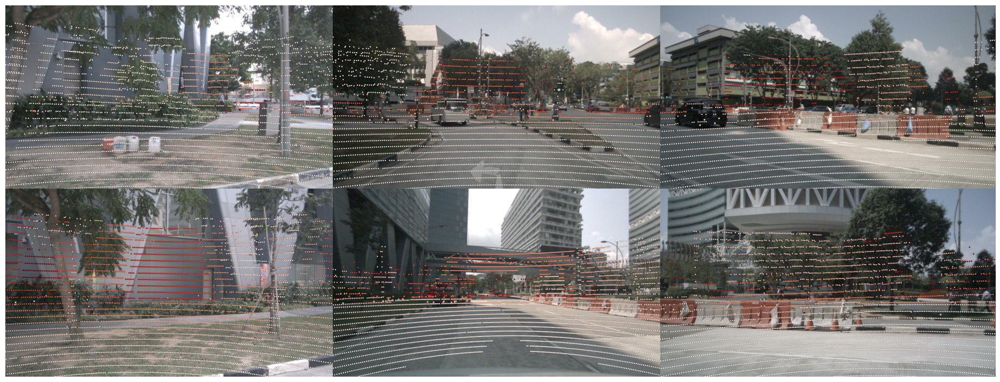

In [8]:
nusc.render_pointcloud_in_scene(my_sample['token'], out_path = '/home/byounghun/workspace/temp_3.jpg', show_both_modality=True)

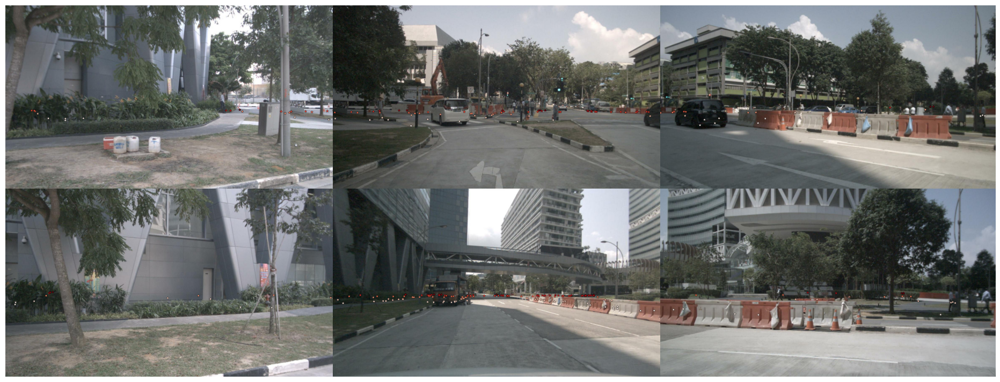

In [9]:
nusc.render_pointcloud_in_scene(my_sample['token'], 15, out_path = '/home/byounghun/workspace/temp_1.jpg')

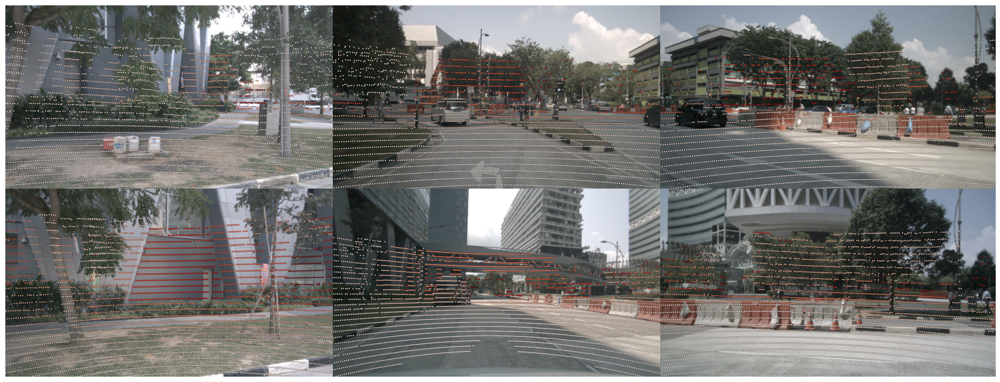

In [10]:
nusc.render_pointcloud_in_scene(my_sample['token'], 3, pointsensor_channel = ['LIDAR_TOP'], out_path = '/home/byounghun/workspace/temp_2.jpg')

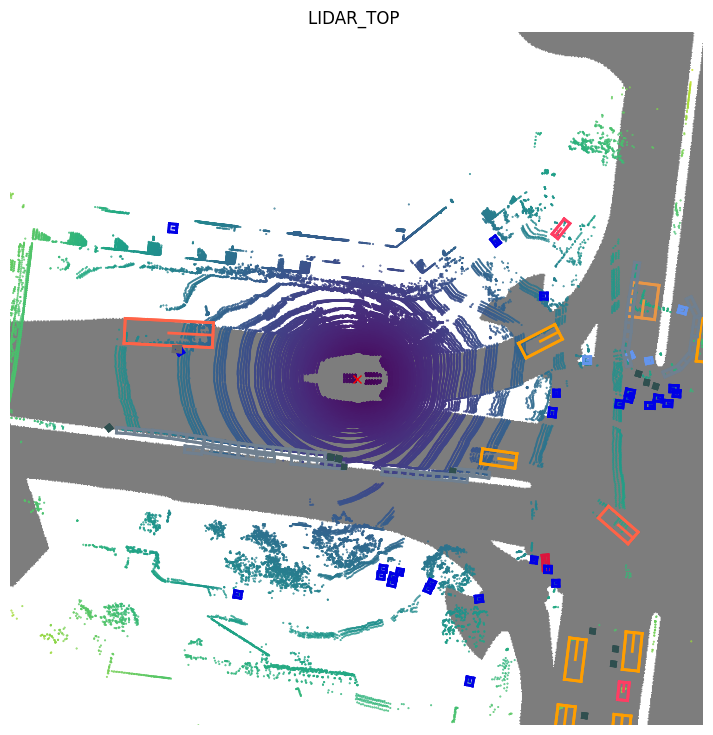

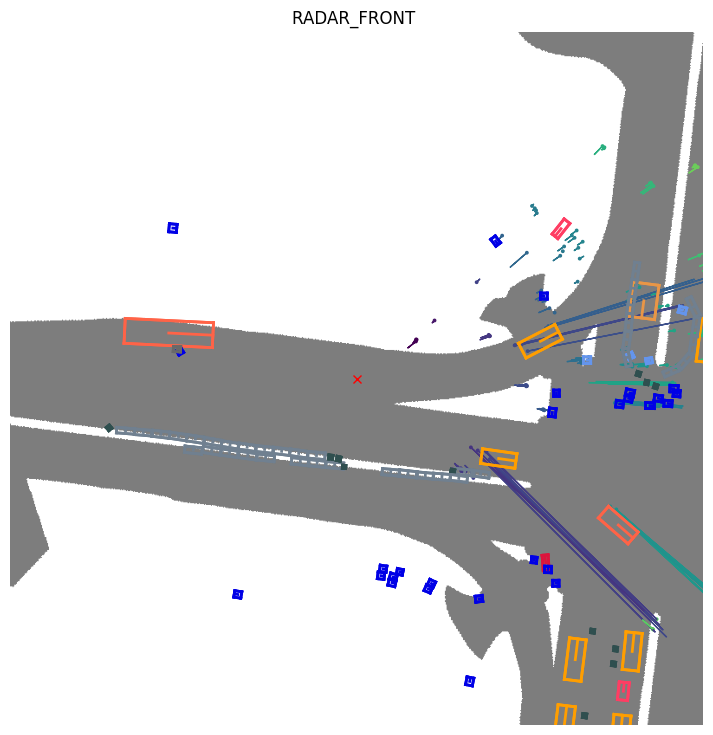

In [11]:
nusc.render_sample_data(my_sample['data']['LIDAR_TOP'], nsweeps=5, underlay_map=True)
nusc.render_sample_data(my_sample['data']['RADAR_FRONT'], nsweeps=5, underlay_map=True)

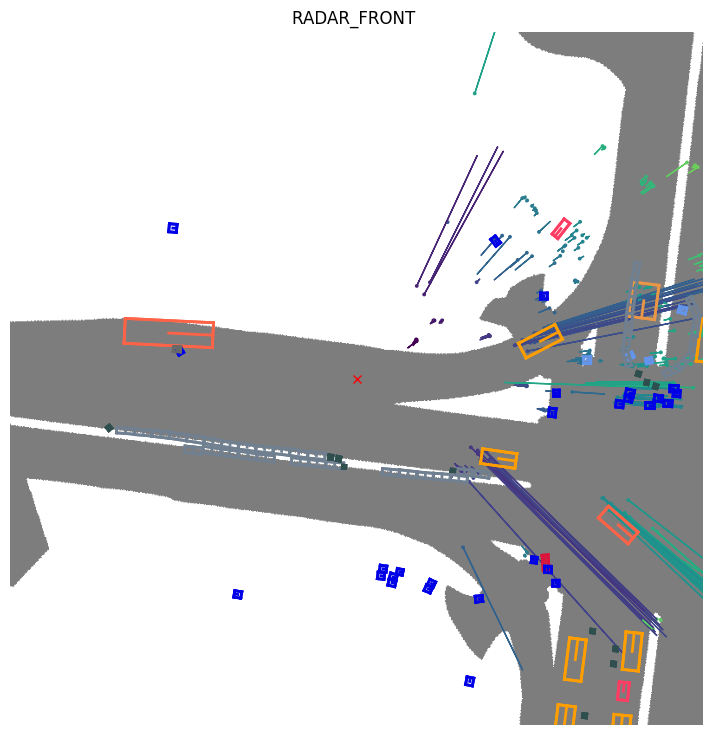

In [12]:
from nuscenes.utils.data_classes import RadarPointCloud
RadarPointCloud.disable_filters()
nusc.render_sample_data(my_sample['data']['RADAR_FRONT'], nsweeps=5, underlay_map=True)
RadarPointCloud.default_filters()

In [ ]:
nusc.list_sample(my_sample['token'])

In [ ]:
my_sample['data']

In [ ]:
sensor = 'CAM_FRONT'
cam_front_data = nusc.get('sample_data', my_sample['data'][sensor])
cam_front_data

In [ ]:
nusc.render_sample_data(cam_front_data['token'])

In [31]:
my_annotation_token = my_sample['anns'][18]
my_annotation_metadata =  nusc.get('sample_annotation', my_annotation_token)
my_annotation_metadata

{'token': '83d881a6b3d94ef3a3bc3b585cc514f8',
 'sample_token': 'ca9a282c9e77460f8360f564131a8af5',
 'instance_token': 'e91afa15647c4c4994f19aeb302c7179',
 'visibility_token': '4',
 'attribute_tokens': ['58aa28b1c2a54dc88e169808c07331e3'],
 'translation': [409.989, 1164.099, 1.623],
 'size': [2.877, 10.201, 3.595],
 'rotation': [-0.5828819500503033, 0.0, 0.0, 0.812556848660791],
 'prev': '',
 'next': 'f3721bdfd7ee4fd2a4f94874286df471',
 'num_lidar_pts': 495,
 'num_radar_pts': 13,
 'category_name': 'vehicle.truck'}

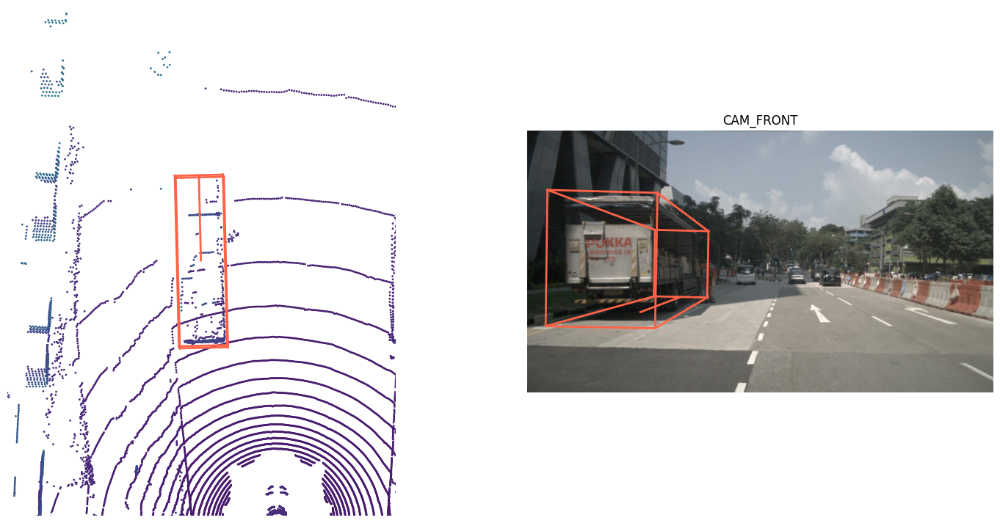

In [32]:
nusc.render_annotation(my_annotation_token)

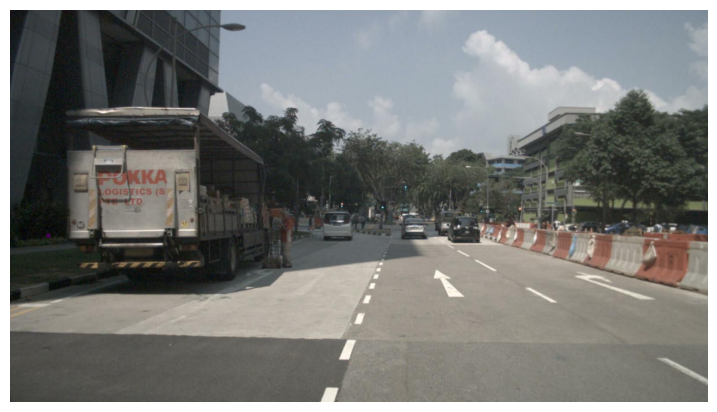

In [33]:
nusc.render_pointcloud_in_image(my_sample['token'], 5, 'RADAR_FRONT_LEFT', 'CAM_FRONT')

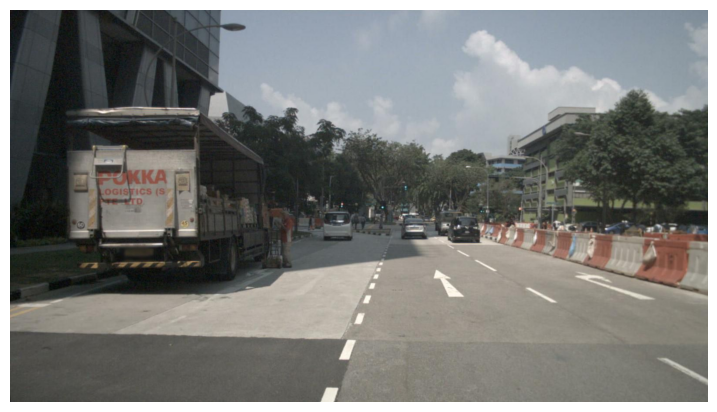

In [16]:
nusc.render_pointcloud_in_image(my_sample['token'], 5, 'RADAR_FRONT_RIGHT', 'CAM_FRONT')

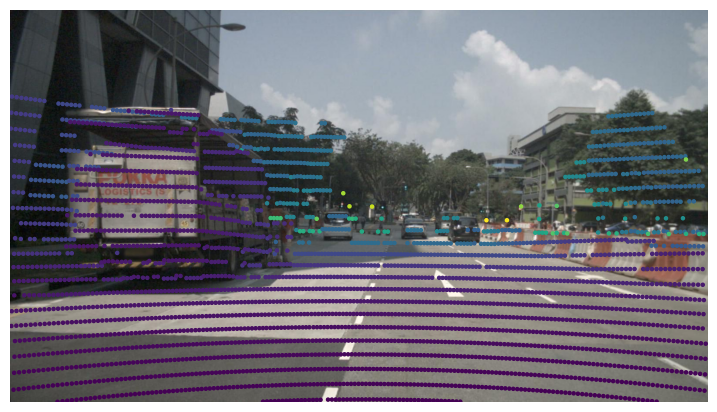

In [17]:
nusc.render_pointcloud_in_image(my_sample['token'], 5, 'LIDAR_TOP', 'CAM_FRONT')

In [18]:
nusc.render_scene(my_scene['token'])

QObject::moveToThread: Current thread (0xac7e2a0) is not the object's thread (0xc828ac0).
Cannot move to target thread (0xac7e2a0)

QObject::moveToThread: Current thread (0xac7e2a0) is not the object's thread (0xc828ac0).
Cannot move to target thread (0xac7e2a0)

QObject::moveToThread: Current thread (0xac7e2a0) is not the object's thread (0xc828ac0).
Cannot move to target thread (0xac7e2a0)

QObject::moveToThread: Current thread (0xac7e2a0) is not the object's thread (0xc828ac0).
Cannot move to target thread (0xac7e2a0)

QObject::moveToThread: Current thread (0xac7e2a0) is not the object's thread (0xc828ac0).
Cannot move to target thread (0xac7e2a0)

QObject::moveToThread: Current thread (0xac7e2a0) is not the object's thread (0xc828ac0).
Cannot move to target thread (0xac7e2a0)

QObject::moveToThread: Current thread (0xac7e2a0) is not the object's thread (0xc828ac0).
Cannot move to target thread (0xac7e2a0)

QObject::moveToThread: Current thread (0xac7e2a0) is not the object's thread